In [1]:
!pip install torch pytorch-lightning pytorch_forecasting torchaudio torchdata torchtext torchvision optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 102.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 75.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 77.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.0/823.0 kB 58.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 197.7/197.7 kB 24.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:

# !pip install torch==2.0.1
# !pip install pytorch-lightning==2.0.2
# !pip install pytorch_forecasting==1.0.0
# !pip install torchaudio==2.0.2
# !pip install torchdata==0.6.1
# !pip install torchtext==0.15.2
# !pip install torchvision==0.15.2
# !pip install optuna==3.4



In [3]:
from pytorch_forecasting import Baseline, TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import GroupNormalizer, NaNLabelEncoder
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss
#from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters
from lightning.pytorch.loggers import TensorBoardLogger
import random
import gc
import torch
from matplotlib import pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
#import pytorch_lightning as pl
import lightning.pytorch as pl
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
import seaborn as sns

## Read the data from  https://www.kaggle.com/datasets/manjeetsingh/retaildataset/data

In [4]:
# import the 3 datasets and assign them to their own variable
# features = pd.read_csv('data/Features data set.csv')
# sales = pd.read_csv('data/sales data-set.csv')
# stores = pd.read_csv('data/stores data-set.csv')

# Merge the three datasets on features, stores and Sales

In [5]:
# merge the 3 separate datasets using the merge function.
# features = features.merge(stores, on = 'Store')
# df = features.merge(sales, on = ['Store','Date','IsHoliday'])
# df.head(4)

In [6]:
df = pd.read_csv('records_per_visit_ohe2.csv')
df.head(4)

,HADM_ID,SUBJECT_ID,GENDER,DOB,DATE,INFECTIOUS_PARASITIC_DISEASES,NEOPLASMS,ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES,BLOOD_BLOOD_FORMING_ORGANS,MENTAL_DISORDERS,...,RESPIRATORY_SYSTEM,DIGESTIVE_SYSTEM,GENITOURINARY_SYSTEM,PREGNANCY_CHILD_BIRTH_PUERPERIUM,SKIN_SUBCUTANEOUS_TISSUE,MUSCULOSKELETAL_CONNECTIVE_TISSUE,CONGENITAL_ANOMALIES,PERINATAL_PERIOD,SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS,INJURY_POISONING
0,182104,36,M,1930-04-20,2000-01-01,0,0,0,0,1,...,1,1,1,0,0,0,0,0,0,0
1,122659,36,M,1930-04-20,2000-01-12,0,0,0,0,0,...,1,1,1,0,0,0,0,0,0,1
2,165660,36,M,1930-04-20,2003-01-10,0,0,0,0,1,...,1,1,1,0,0,0,0,0,0,1
3,174486,357,M,1937-04-15,2000-01-01,0,0,1,1,0,...,1,1,0,0,0,0,0,0,1,0


# Data Analysis

In [7]:
# change the 'Date' column to the datetime format
df['DATE'] = pd.to_datetime(df['DATE'],format="%Y-%m-%d" )
# sort the dataframe by date
df = df.sort_values(by='DATE')
# make new columns from the day, month, and year
# df['Day'] = df['DATE'].dt.day
# df['Month'] = df['DATE'].dt.month
# df['Year'] = df['DATE'].dt.year
# set the index to the date column, make sure its in the datetime format
df = df.set_index('DATE')

In [8]:
df.head(4)

,HADM_ID,SUBJECT_ID,GENDER,DOB,INFECTIOUS_PARASITIC_DISEASES,NEOPLASMS,ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES,BLOOD_BLOOD_FORMING_ORGANS,MENTAL_DISORDERS,NERVOUS_SYSTEM_SENSE_ORGANS,...,RESPIRATORY_SYSTEM,DIGESTIVE_SYSTEM,GENITOURINARY_SYSTEM,PREGNANCY_CHILD_BIRTH_PUERPERIUM,SKIN_SUBCUTANEOUS_TISSUE,MUSCULOSKELETAL_CONNECTIVE_TISSUE,CONGENITAL_ANOMALIES,PERINATAL_PERIOD,SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS,INJURY_POISONING
DATE,,,,,,,,,,,,,,,,,,,,,
2000-01-01,182104,36,M,1930-04-20,0,0,0,0,1,0,...,1,1,1,0,0,0,0,0,0,0
2000-01-01,116509,32367,M,1935-04-01,0,0,1,0,1,1,...,0,0,0,0,0,1,0,0,0,1
2000-01-01,116193,31470,M,1699-12-30,0,0,1,1,0,0,...,0,0,0,0,0,1,0,0,0,1
2000-01-01,176493,30915,F,1955-07-17,1,0,1,0,0,1,...,0,0,1,0,1,1,0,0,1,1


Weekly Sales for Store 1

In [9]:
# filtered_store_df = df[(df['Store'] ==1) ]
# filtered_store_df['Weekly_Sales'].plot(figsize=(25,8));

# filtered_store_df = df[(df['SUBJECT_ID'] ==109) ]
# filtered_store_df['DATE'].plot(figsize=(25,8));

In [10]:
# weekly_sales = df.groupby(['Store', 'Dept'])['Weekly_Sales'].sum()

# # plot the Weekly Sales column
# weekly_sales.plot(figsize=(25,8));

In [11]:
# df_Sales = df[['Weekly_Sales']]
# df_Sales = df_Sales.resample(rule='M').mean()
# # rename the 'Weekly_Sales' column to 'Monthly_Sales'
# df_Sales = df_Sales.rename(columns={'Weekly_Sales':'Monthly_Sales'})
# # plot the sales on a lineplot
# df_Sales.plot(figsize=(20,8))

# plt.title('Average Monthly Sales')
# plt.xlabel('Date')
# plt.ylabel('Dollar Sales');

In [12]:
# fig, ax = plt.subplots(1, 1, figsize = (20, 8))
# sns.lineplot(x='Date',y='Weekly_Sales',hue='Store',data=(df.groupby(['Date', 'Store']).Weekly_Sales.sum().rename('Weekly_Sales')
#                                                        .reset_index().sort_values('Date', ascending = True, ignore_index=True)), linewidth = 2, alpha = 0.7)
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
# plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=120))
# ax.set_xlabel('Date', color='black', fontweight='bold', fontsize=13)
# ax.set_ylabel('Weekly Sales', color='black', fontweight='bold', fontsize=13)
# ax.legend(fontsize = 20, loc = 'upper left')
# ax.set_title('num_sold per Store and Date', fontweight = 'bold', fontsize = 20);

# Building TimeSeriesDataSet for TFT

# **Goal : To predict weekly sales for 45 stores **


**Building time_idx:  Creating  a new integer column time_idx for each row within each store's weekly sales data, representing the sequential order of the data points within that store**

In [13]:
df= df.reset_index()
df_tft = df.sort_values(by=['SUBJECT_ID', 'DATE'])
#df['time_idx'] = df.groupby(['Store', 'Dept']).cumcount()
df_tft['time_idx'] = df_tft.groupby(['SUBJECT_ID']).cumcount()
# If you want the index to start from 1 instead of 0
df_tft['time_idx'] = df_tft['time_idx'] + 1

**We want to predict Weekly Sales for 45 stores, hence Store column will be used for grouping the data and needs to be categorical. If groupid column in numeric then  convert it to a categorical column else you will encounter error**

In [14]:
df_tft['SUBJECT_ID']="SUBJECT_ID " + df_tft['SUBJECT_ID'].astype(str)

**Displaying** the time_idx for a few stores

In [15]:
df_tft.columns

Index(['DATE', 'HADM_ID', 'SUBJECT_ID', 'GENDER', 'DOB',
       'INFECTIOUS_PARASITIC_DISEASES', 'NEOPLASMS',
       'ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES',
       'BLOOD_BLOOD_FORMING_ORGANS', 'MENTAL_DISORDERS',
       'NERVOUS_SYSTEM_SENSE_ORGANS', 'CIRCULATORY_SYSTEM',
       'RESPIRATORY_SYSTEM', 'DIGESTIVE_SYSTEM', 'GENITOURINARY_SYSTEM',
       'PREGNANCY_CHILD_BIRTH_PUERPERIUM', 'SKIN_SUBCUTANEOUS_TISSUE',
       'MUSCULOSKELETAL_CONNECTIVE_TISSUE', 'CONGENITAL_ANOMALIES',
       'PERINATAL_PERIOD', 'SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS',
       'INJURY_POISONING', 'time_idx'],
      dtype='object')

In [16]:
# convert gender to boolean
df_tft['GENDER'] = df_tft['GENDER'].astype(bool)

In [17]:
# convert DOB to a date and then to day, month year
df_tft['DOB'] = pd.to_datetime(df_tft['DOB'],format="%Y-%m-%d" )
df_tft['Day'] = df_tft['DOB'].dt.day
df_tft['Month'] = df_tft['DOB'].dt.month
df_tft['Year'] = df_tft['DOB'].dt.year

In [18]:
# # convert date to timestamp
# df_tft['DATE'] = df_tft['DATE'].dt.strftime("%Y%m%d").astype(int)   # this is wrong. just converts the string to an int, sigh
# # convert to float
# df_tft['DATE'] = df_tft['DATE'].astype(float)

# Convert string to datetime
df_tft['DATE'] = pd.to_datetime(df_tft['DATE'])

# Convert datetime to Unix timestamp (in seconds)
df_tft['DATE'] = df_tft['DATE'].astype('int64') // 10**9  # now it's integer seconds

# Convert seconds to days
df_tft['DATE'] = df_tft['DATE'] / 86400  # Convert Unix timestamp from seconds to days

# Convert to float (required by TFT)
df_tft['DATE'] = df_tft['DATE'].astype(float)

In [19]:
# convert all icd columns to str type values only
# df_tft['ICD1']=df_tft['ICD1'].astype('str')
# df_tft['ICD2']=df_tft['ICD2'].astype('str')
# df_tft['ICD3']=df_tft['ICD3'].astype('str')

# 'INFECTIOUS_PARASITIC_DISEASES', 'NEOPLASMS', 'ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES', 'BLOOD_BLOOD_FORMING_ORGANS', 'MENTAL_DISORDERS', 'NERVOUS_SYSTEM_SENSE_ORGANS', 'CIRCULATORY_SYSTEM', 'RESPIRATORY_SYSTEM', 'DIGESTIVE_SYSTEM', 'GENITOURINARY_SYSTEM', 'PREGNANCY_CHILD_BIRTH_PUERPERIUM', 'SKIN_SUBCUTANEOUS_TISSUE', 'MUSCULOSKELETAL_CONNECTIVE_TISSUE', 'CONGENITAL_ANOMALIES', 'PERINATAL_PERIOD', 'SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS', 'INJURY_POISONING'
# convert the one hot encoding stuff to bool
df_tft['INFECTIOUS_PARASITIC_DISEASES'] = df_tft['INFECTIOUS_PARASITIC_DISEASES'].astype(bool)
df_tft['NEOPLASMS'] = df_tft['NEOPLASMS'].astype(bool)
df_tft['ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES'] = df_tft['ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES'].astype(bool)
df_tft['BLOOD_BLOOD_FORMING_ORGANS'] = df_tft['BLOOD_BLOOD_FORMING_ORGANS'].astype(bool)
df_tft['MENTAL_DISORDERS'] = df_tft['MENTAL_DISORDERS'].astype(bool)
df_tft['NERVOUS_SYSTEM_SENSE_ORGANS'] = df_tft['NERVOUS_SYSTEM_SENSE_ORGANS'].astype(bool)
df_tft['CIRCULATORY_SYSTEM'] = df_tft['CIRCULATORY_SYSTEM'].astype(bool)
df_tft['RESPIRATORY_SYSTEM'] = df_tft['RESPIRATORY_SYSTEM'].astype(bool)
df_tft['DIGESTIVE_SYSTEM'] = df_tft['DIGESTIVE_SYSTEM'].astype(bool)
df_tft['GENITOURINARY_SYSTEM'] = df_tft['GENITOURINARY_SYSTEM'].astype(bool)
df_tft['PREGNANCY_CHILD_BIRTH_PUERPERIUM'] = df_tft['PREGNANCY_CHILD_BIRTH_PUERPERIUM'].astype(bool)
df_tft['SKIN_SUBCUTANEOUS_TISSUE'] = df_tft['SKIN_SUBCUTANEOUS_TISSUE'].astype(bool)
df_tft['MUSCULOSKELETAL_CONNECTIVE_TISSUE'] = df_tft['MUSCULOSKELETAL_CONNECTIVE_TISSUE'].astype(bool)
df_tft['CONGENITAL_ANOMALIES'] = df_tft['CONGENITAL_ANOMALIES'].astype(bool)
df_tft['PERINATAL_PERIOD'] = df_tft['PERINATAL_PERIOD'].astype(bool)
df_tft['SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS'] = df_tft['SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS'].astype(bool)
df_tft['INJURY_POISONING'] = df_tft['INJURY_POISONING'].astype(bool)


In [20]:
# check the data type of a column
df_tft.dtypes

,0
DATE,float64
HADM_ID,int64
SUBJECT_ID,object
GENDER,bool
DOB,datetime64[ns]
INFECTIOUS_PARASITIC_DISEASES,bool
NEOPLASMS,bool
ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES,bool
BLOOD_BLOOD_FORMING_ORGANS,bool
MENTAL_DISORDERS,bool


In [21]:
df_test=df_tft
#  [['time_idx','Date','Store', 'Dept','Temperature', 'Fuel_Price','CPI', 'Unemployment','IsHoliday', 'Type', 'Size',  'Weekly_Sales' ]]
target_stores = ['SUBJECT_ID 109', 'SUBJECT_ID 36', 'SUBJECT_ID 22921']

# Filter for rows where the `time_idx` is the same for the target stores
filtered_df = df_test[df_test['SUBJECT_ID'].isin(target_stores)]

# Group by `time_idx` and check if any group has more than 2 unique stores
grouped_df = filtered_df.groupby('time_idx')['SUBJECT_ID'].nunique()
same_time_idx = grouped_df[grouped_df > 2].index.tolist()

same_time_idx=[1,2,3,4,5,6]

# Filter for rows with the identified `time_idx` values
result_df = filtered_df[filtered_df['time_idx'].isin(same_time_idx)]
result_df

,DATE,HADM_ID,SUBJECT_ID,GENDER,DOB,INFECTIOUS_PARASITIC_DISEASES,NEOPLASMS,ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES,BLOOD_BLOOD_FORMING_ORGANS,MENTAL_DISORDERS,...,SKIN_SUBCUTANEOUS_TISSUE,MUSCULOSKELETAL_CONNECTIVE_TISSUE,CONGENITAL_ANOMALIES,PERINATAL_PERIOD,SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS,INJURY_POISONING,time_idx,Day,Month,Year
0,10957.0,182104,SUBJECT_ID 36,True,1930-04-20,False,False,False,False,True,...,False,False,False,False,False,False,1,20,4,1930
2406,10968.0,122659,SUBJECT_ID 36,True,1930-04-20,False,False,False,False,False,...,False,False,False,False,False,True,2,20,4,1930
7049,12062.0,165660,SUBJECT_ID 36,True,1930-04-20,False,False,False,False,True,...,False,False,False,False,False,True,3,20,4,1930
1029,10957.0,119313,SUBJECT_ID 22921,True,1949-12-23,False,False,False,False,True,...,False,False,False,False,False,True,1,23,12,1949
8807,14184.0,127403,SUBJECT_ID 22921,True,1949-12-23,False,False,True,False,True,...,False,False,False,False,False,False,2,23,12,1949
8855,14410.0,103590,SUBJECT_ID 22921,True,1949-12-23,False,False,False,False,True,...,False,False,False,False,True,False,3,23,12,1949
8874,14512.0,128083,SUBJECT_ID 22921,True,1949-12-23,False,False,False,False,True,...,False,False,False,False,False,False,4,23,12,1949
8878,14527.0,135037,SUBJECT_ID 22921,True,1949-12-23,False,False,False,False,True,...,False,False,False,False,False,False,5,23,12,1949


# TimeSeriesDataSet for TFT

In [22]:
train_cnt=int(len(df_tft)*.7)
#train_cnt=150
train = df_tft.iloc[:train_cnt]
test = df_tft.iloc[train_cnt:]

max_prediction_length = 1   #
max_encoder_length = 10     # 365

In [23]:
#  create TFT TimeSeriesDataset
training = TimeSeriesDataSet(
    train[: train_cnt],
    time_idx="time_idx",
    target="DATE",
    group_ids=[ "SUBJECT_ID"],
    min_encoder_length=max_prediction_length,  # keep encoder length long (as it is in the validation set)
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    static_categoricals=["SUBJECT_ID"],
    static_reals=['Day','Month', 'Year', 'GENDER'],
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=['DATE', 'INFECTIOUS_PARASITIC_DISEASES', 'NEOPLASMS', 'ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES', 'BLOOD_BLOOD_FORMING_ORGANS', 'MENTAL_DISORDERS', 'NERVOUS_SYSTEM_SENSE_ORGANS', 'CIRCULATORY_SYSTEM', 'RESPIRATORY_SYSTEM', 'DIGESTIVE_SYSTEM', 'GENITOURINARY_SYSTEM', 'PREGNANCY_CHILD_BIRTH_PUERPERIUM', 'SKIN_SUBCUTANEOUS_TISSUE', 'MUSCULOSKELETAL_CONNECTIVE_TISSUE', 'CONGENITAL_ANOMALIES', 'PERINATAL_PERIOD', 'SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS', 'INJURY_POISONING'],
    # time_varying_unknown_reals=['DATE'],
    # time_varying_unknown_categoricals=['ICD1', 'ICD2', 'ICD3'],

    target_normalizer=GroupNormalizer(
        groups=[ "SUBJECT_ID"], transformation="softplus"
    ),   #use softplus and normalize by group
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
    allow_missing_timesteps=True
)

# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(training, train, predict=True, stop_randomization=True)

# create dataloaders for model
batch_size = 32  # set this between 32 to 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=8)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=8)


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [24]:
# my code to get y from val_dataloader (so that I can later compare with predictions)


# Fetch one batch from the validation dataloader
batch = next(iter(val_dataloader))

# `x` contains input features, `y` contains target values (actual timestamps)
x, y = batch

print(f"Keys in x: {x.keys()}")  # Inspect available input features
print(f"Type of y: {type(y)}")    # Check if y is a tuple
print(f"Length of y: {len(y)}")   # Check the structure of y if it's a tuple

# Extract actual timestamps
actual_dates = y[0]  # The first element of y is the target (timestamps)
print(f"Shape of actual_dates: {actual_dates.shape}")
print(f"Sample values: {actual_dates[:5]}")


Keys in x: dict_keys(['encoder_cat', 'encoder_cont', 'encoder_target', 'encoder_lengths', 'decoder_cat', 'decoder_cont', 'decoder_target', 'decoder_lengths', 'decoder_time_idx', 'groups', 'target_scale'])
Type of y: <class 'tuple'>
Length of y: 2
Shape of actual_dates: torch.Size([320, 1])
Sample values: tensor([[11264.],
        [11084.],
        [12684.],
        [11370.],
        [11050.]])


# HyperParameter Tuning for TFT

In [ ]:
import optuna
#from pytorch_lightning import Trainer
from torchmetrics import MeanAbsoluteError, MeanSquaredError
#from pytorch_forecasting import TemporalFusionTransformer
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor

def objective(trial):
    # Defone Hyperparameters
    hidden_size = trial.suggest_int("hidden_size", 4, 8)
    lstm_layers = trial.suggest_int("lstm_layers", 1,4)
    dropout = trial.suggest_float("dropout",  0.5, 0.7)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)

    #optimizer=trial.suggest_categorical("optimizer", ["Adam", "AdamW"])
    attention_head_size=trial.suggest_int("attention_head_size", 1,2)
    #hidden_continuous_size=trial.suggest_int("hidden_continuous_size",1,2)
    #loss=trial.suggest_categorical("loss", ["MSELoss", "PoissonLoss", "QuantileLoss"])
    #reduce_on_plateau_patience=trial.suggest_int("reduce_on_plateau_patience", 1,2)


    # create the TFT Model with suggest HP
    tft = TemporalFusionTransformer.from_dataset(
        training,
        learning_rate=learning_rate,
        hidden_size=hidden_size,
        lstm_layers=lstm_layers,
        dropout=dropout,
        hidden_continuous_size=1,
        attention_head_size=attention_head_size,
        loss=QuantileLoss(),
        optimizer="AdamW",
        reduce_on_plateau_patience=1,

    )
    early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
    lr_logger = LearningRateMonitor()  # log the learning rate
    logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

    # Train the Model
    trainer = pl.Trainer(
    max_epochs=30,
    accelerator="gpu",
    #enable_model_summary=True,
    gradient_clip_val=0.5,
    limit_train_batches=100,  # coment in for training, running valiation every 30 batches
    #fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
    )

    trainer.fit(
        tft,
        train_dataloaders=train_dataloader,
        val_dataloaders=val_dataloader
    )


    #Evaluate the Model
    val_loss= trainer.callback_metrics['val_loss'].item()
    return val_loss


In [ ]:
# Create a Study and specify the direction of optimization
study = optuna.create_study(direction="minimize")
# Optimize the objective function
study.optimize(objective, n_trials=30)
print(f"Best Hyperparameters: {study.best_params}")

[I 2025-04-07 16:48:45,369] A new study created in memory with name: no-name-e925d61d-8892-4625-87c2-a508568a1173
<ipython-input-25-d6befb651006>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
INFO:pytorch_lightning.utilities.

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 16:52:42,974] Trial 0 finished with value: 105.59120178222656 and parameters: {'hidden_size': 5, 'lstm_layers': 4, 'dropout': 0.5345901244358442, 'learning_rate': 0.0029220391802537078, 'attention_head_size': 2}. Best is trial 0 with value: 105.59120178222656.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
---------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 16:55:47,307] Trial 1 finished with value: 88.2304458618164 and parameters: {'hidden_size': 5, 'lstm_layers': 2, 'dropout': 0.691507263487122, 'learning_rate': 0.003947980642905904, 'attention_head_size': 1}. Best is trial 1 with value: 88.2304458618164.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
---------------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 17:01:36,754] Trial 2 finished with value: 83.11164855957031 and parameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.6893474008555174, 'learning_rate': 0.0011831755365561965, 'attention_head_size': 2}. Best is trial 2 with value: 83.11164855957031.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
-----------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 17:05:15,481] Trial 3 finished with value: 89.5029067993164 and parameters: {'hidden_size': 4, 'lstm_layers': 3, 'dropout': 0.6284888674371603, 'learning_rate': 0.0010248504489499472, 'attention_head_size': 2}. Best is trial 2 with value: 83.11164855957031.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
------------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-07 17:13:30,383] Trial 4 finished with value: 77.86369323730469 and parameters: {'hidden_size': 7, 'lstm_layers': 4, 'dropout': 0.5883718369840362, 'learning_rate': 0.0015097962603259402, 'attention_head_size': 1}. Best is trial 4 with value: 77.86369323730469.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | P

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 17:16:34,658] Trial 5 finished with value: 97.2193832397461 and parameters: {'hidden_size': 8, 'lstm_layers': 1, 'dropout': 0.6585838166014149, 'learning_rate': 0.003919315682663605, 'attention_head_size': 1}. Best is trial 4 with value: 77.86369323730469.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
-------------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 17:21:43,844] Trial 6 finished with value: 114.65887451171875 and parameters: {'hidden_size': 4, 'lstm_layers': 2, 'dropout': 0.6095066235804262, 'learning_rate': 0.00017000524381160235, 'attention_head_size': 1}. Best is trial 4 with value: 77.86369323730469.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
---------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 17:25:06,686] Trial 7 finished with value: 103.46138000488281 and parameters: {'hidden_size': 7, 'lstm_layers': 2, 'dropout': 0.50361863246167, 'learning_rate': 0.0028041860374349685, 'attention_head_size': 1}. Best is trial 4 with value: 77.86369323730469.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
------------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 17:31:10,378] Trial 8 finished with value: 82.90760803222656 and parameters: {'hidden_size': 8, 'lstm_layers': 3, 'dropout': 0.6849518269656584, 'learning_rate': 0.0007001312359994074, 'attention_head_size': 2}. Best is trial 4 with value: 77.86369323730469.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
-----------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-07 17:39:04,297] Trial 9 finished with value: 80.84921264648438 and parameters: {'hidden_size': 8, 'lstm_layers': 2, 'dropout': 0.5097862758133194, 'learning_rate': 0.0009406865007712299, 'attention_head_size': 2}. Best is trial 4 with value: 77.86369323730469.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | P

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 17:43:48,352] Trial 10 finished with value: 90.730712890625 and parameters: {'hidden_size': 7, 'lstm_layers': 4, 'dropout': 0.5647078780400604, 'learning_rate': 0.008731545408867405, 'attention_head_size': 1}. Best is trial 4 with value: 77.86369323730469.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
-------------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 17:48:47,361] Trial 11 finished with value: 98.58509063720703 and parameters: {'hidden_size': 7, 'lstm_layers': 3, 'dropout': 0.5698798086986955, 'learning_rate': 0.00038664381277085815, 'attention_head_size': 2}. Best is trial 4 with value: 77.86369323730469.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
---------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 17:54:44,662] Trial 12 finished with value: 85.41007995605469 and parameters: {'hidden_size': 8, 'lstm_layers': 4, 'dropout': 0.5032858538977054, 'learning_rate': 0.0004609891379441785, 'attention_head_size': 2}. Best is trial 4 with value: 77.86369323730469.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
----------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 17:59:48,232] Trial 13 finished with value: 78.22999572753906 and parameters: {'hidden_size': 7, 'lstm_layers': 2, 'dropout': 0.5715885292575411, 'learning_rate': 0.0014240245821231768, 'attention_head_size': 1}. Best is trial 4 with value: 77.86369323730469.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
----------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 18:04:21,238] Trial 14 finished with value: 87.46234130859375 and parameters: {'hidden_size': 6, 'lstm_layers': 3, 'dropout': 0.5767344428130627, 'learning_rate': 0.0018450506914098387, 'attention_head_size': 1}. Best is trial 4 with value: 77.86369323730469.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
----------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-07 18:12:16,935] Trial 15 finished with value: 49.383663177490234 and parameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.6022030042128628, 'learning_rate': 0.00748038789550776, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-07 18:20:08,557] Trial 16 finished with value: 68.05277252197266 and parameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.617066691735854, 'learning_rate': 0.00861987702602327, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | P

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 18:22:59,879] Trial 17 finished with value: 94.46143341064453 and parameters: {'hidden_size': 5, 'lstm_layers': 1, 'dropout': 0.6320436399435209, 'learning_rate': 0.00782561124914062, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
----------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-07 18:30:48,785] Trial 18 finished with value: 52.19072341918945 and parameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.6168417085001565, 'learning_rate': 0.006933814503335128, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 18:34:17,915] Trial 19 finished with value: 98.80465698242188 and parameters: {'hidden_size': 5, 'lstm_layers': 1, 'dropout': 0.655359549776011, 'learning_rate': 0.005613926105099443, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
----------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 18:37:41,217] Trial 20 finished with value: 108.49627685546875 and parameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.5434040022453575, 'learning_rate': 0.005626536006084914, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
--------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 18:40:35,451] Trial 21 finished with value: 97.31488800048828 and parameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.6065943895671093, 'learning_rate': 0.008375276939311711, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
---------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 18:43:45,700] Trial 22 finished with value: 105.71239471435547 and parameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.6394726112699942, 'learning_rate': 0.005788797513200505, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
--------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 18:46:56,646] Trial 23 finished with value: 95.14313507080078 and parameters: {'hidden_size': 5, 'lstm_layers': 1, 'dropout': 0.6164809931276917, 'learning_rate': 0.009768549912741389, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
---------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 18:51:26,511] Trial 24 finished with value: 65.50568389892578 and parameters: {'hidden_size': 6, 'lstm_layers': 2, 'dropout': 0.5990433301872227, 'learning_rate': 0.0024506494328723786, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
--------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 18:57:17,209] Trial 25 finished with value: 84.23136138916016 and parameters: {'hidden_size': 6, 'lstm_layers': 2, 'dropout': 0.5930620418859628, 'learning_rate': 0.0021497078419776537, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
--------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 19:03:24,531] Trial 26 finished with value: 70.03238677978516 and parameters: {'hidden_size': 6, 'lstm_layers': 2, 'dropout': 0.6470490393838917, 'learning_rate': 0.004232919904776618, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
---------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 19:09:18,466] Trial 27 finished with value: 92.73602294921875 and parameters: {'hidden_size': 5, 'lstm_layers': 2, 'dropout': 0.6717674015368232, 'learning_rate': 0.0025228388488501012, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
--------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-04-07 19:15:24,372] Trial 28 finished with value: 86.12128448486328 and parameters: {'hidden_size': 7, 'lstm_layers': 1, 'dropout': 0.5520510092892374, 'learning_rate': 0.000110019625054587, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
---------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-07 19:23:20,886] Trial 29 finished with value: 60.895748138427734 and parameters: {'hidden_size': 5, 'lstm_layers': 1, 'dropout': 0.5935572318576495, 'learning_rate': 0.003582098420179099, 'attention_head_size': 1}. Best is trial 15 with value: 49.383663177490234.


Best Hyperparameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.6022030042128628, 'learning_rate': 0.00748038789550776, 'attention_head_size': 1}


# Best HyperParameters

In [ ]:
print(f"Best Hyperparameters: {study.best_params}")
#Best Hyperparameters: {'hidden_size': 8, 'lstm_layers': 1,
#'dropout': 0.055314387927025505, 'learning_rate': 0.001435011693425754,
#'optimizer': 'AdamW', 'attention_head_size': 1,
#'hidden_continuous_size': 1, 'reduce_on_plateau_patience': 1}

# Best Hyperparameters: {'hidden_size': 6, 'lstm_layers': 3, 'dropout': 0.5075243372332862, 'learning_rate': 0.009983150713775318, 'attention_head_size': 1}
# 03/10 Best Hyperparameters: {'hidden_size': 5, 'lstm_layers': 2, 'dropout': 0.6858495510342201, 'learning_rate': 0.0017298395596936577, 'attention_head_size': 1}

# 03/11 Best Hyperparameters: {'hidden_size': 4, 'lstm_layers': 1, 'dropout': 0.5870872818075697, 'learning_rate': 0.002236988516289264, 'attention_head_size': 2}

# 04/04 with ohe Best Hyperparameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.5692684724008775, 'learning_rate': 0.0003234520234429557, 'attention_head_size': 2}

# 04/06 with ohe, fixed unix timestamp Best Hyperparameters: {'hidden_size': 5, 'lstm_layers': 2, 'dropout': 0.6860531687333428, 'learning_rate': 0.0068541134378341355, 'attention_head_size': 2}

# 04/08 Best Hyperparameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.6022030042128628, 'learning_rate': 0.00748038789550776, 'attention_head_size': 1}

# hidden_continuous_size=  # set to <= hidden_size

Best Hyperparameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.6022030042128628, 'learning_rate': 0.00748038789550776, 'attention_head_size': 1}


Train the Model with best

In [25]:
hidden_size = 6
lstm_layers = 1
dropout = 0.602203004
learning_rate = 0.007480387
attention_head_size = 1
hidden_continuous_size = hidden_size

In [26]:
# configure network and trainer
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=50,
    accelerator="gpu",
    enable_model_summary=True,
    gradient_clip_val=0.1,
    limit_train_batches=100,  # coment in for training, running valiation every 30 batches
    #fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    # callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate= learning_rate,
    hidden_size= hidden_size,
    attention_head_size= attention_head_size,

    hidden_continuous_size= hidden_continuous_size,
    loss=QuantileLoss(),
    # log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    optimizer="AdamW",
    reduce_on_plateau_patience=1,
    lstm_layers= lstm_layers,
    dropout= dropout,
)

print(f"Number of parameters in network: {tft.size() / 1e3:.1f}k")

INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


Number of parameters in network: 19.2k


# Train the model

In [27]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
------------------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0      | train
1  | logging_metrics                    | ModuleList                      | 0      | train
2  | input_embeddings                   | MultiEmbedding                  | 9.6 K  | train
3  | prescalers                         | ModuleDict                      | 324    | train
4  | static_variable_selection          | VariableSelectionNetwork        | 1.9 K  | train
5  | encoder_variable_selection         | VariableSelectionNetwork        | 5.0 K  | train
6  | decoder_variable_selection         | VariableSelectionNetwork        | 450    | train
7  | static_context_variable_selectio

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


In [28]:
best_model_path = trainer.checkpoint_callback.best_model_path
print(best_model_path)
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

lightning_logs/lightning_logs/version_0/checkpoints/epoch=49-step=5000.ckpt


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


In [29]:
actuals=torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions=best_tft.predict(val_dataloader, mode="raw", return_x=True)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/dist-packages/pytorch_forecasting/models/base_model.py:121: UserWarning: Not all dimensions are equal for tensors shapes. Example tensor torch.Size([320, 1, 1, 8]). Returning list instead of torch.Tensor.
  warnings.warn(


In [30]:
predictions.x.keys()

dict_keys(['encoder_cat', 'encoder_cont', 'encoder_target', 'encoder_lengths', 'decoder_cat', 'decoder_cont', 'decoder_target', 'decoder_lengths', 'decoder_time_idx', 'groups', 'target_scale'])

In [31]:
# best_tft.plot_prediction(predictions.x, predictions.output, idx=1, add_loss_to_title=True)

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def simple_plot_prediction(x, out, idx=0, show_future_observed=True, ax=None):
    """
    Simpler version of plot_prediction to visualize predictions vs actual values.

    Args:
        x (dict): Network input containing actual values.
        out (dict): Network output containing predictions.
        idx (int): Index of the prediction sample to plot.
        show_future_observed (bool): Whether to show actual future values.
        ax: Matplotlib axis to plot on.

    Returns:
        matplotlib figure
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 4))
    else:
        fig = ax.get_figure()

    # Extract true values
    encoder_target = x["encoder_target"].cpu().numpy()[idx]
    decoder_target = x["decoder_target"].cpu().numpy()[idx]
    y_true = np.concatenate([encoder_target, decoder_target])

    # Extract predicted values
    y_pred = out["prediction"].detach().cpu().numpy()[idx]

    # X-axis time indices
    max_encoder_length = x["encoder_lengths"].max().item()
    x_obs = np.arange(-(len(y_true) - len(y_pred)), 0)  # Past observations
    x_pred = np.arange(len(y_pred))  # Future predictions

    # Plot actual values
    ax.plot(x_obs, y_true[:-len(y_pred)], label="Observed", color="blue", marker="o")

    # Plot future actual values (if enabled)
    if show_future_observed:
        ax.plot(x_pred, y_true[-len(y_pred):], label="True Future", color="blue", linestyle="dashed")

    # Plot predicted values
    ax.plot(x_pred, y_pred, label="Predicted", color="red", marker="x")

    ax.set_xlabel("Time Index")
    ax.set_ylabel("Next Visit Date")
    ax.legend()
    ax.set_title("Prediction vs Actual")

    plt.show()
    return fig


In [33]:
print(predictions.x.keys())

dict_keys(['encoder_cat', 'encoder_cont', 'encoder_target', 'encoder_lengths', 'decoder_cat', 'decoder_cont', 'decoder_target', 'decoder_lengths', 'decoder_time_idx', 'groups', 'target_scale'])


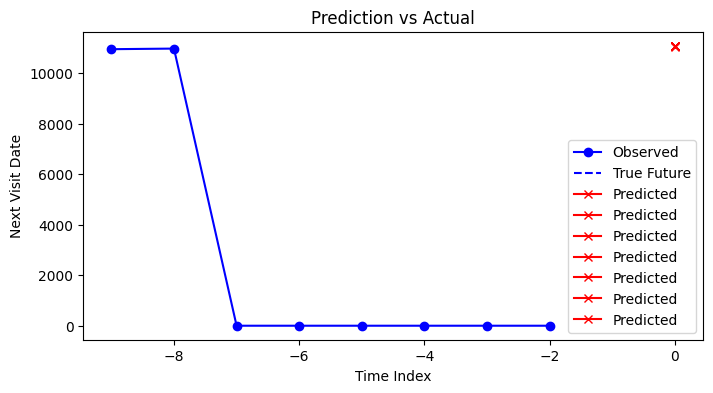

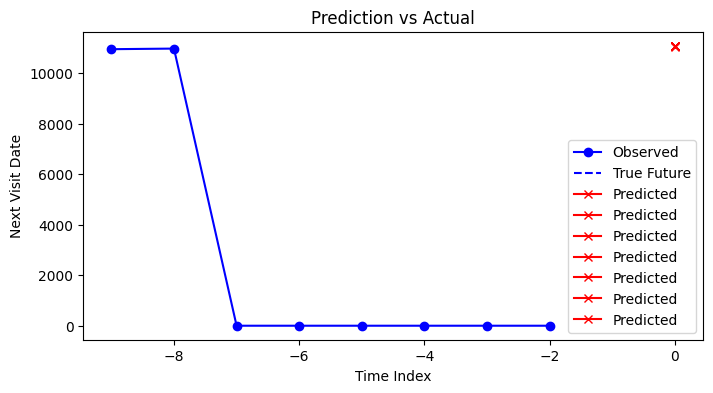

In [34]:
simple_plot_prediction(predictions.x, predictions.output, idx=1)


In [35]:
print(predictions.output.keys())
# print(predictions.output.prediction)

import numpy as np

# Extract tensor values
yerr = predictions.output.prediction.cpu().numpy()  # Move to CPU & convert to NumPy

# Count negative values
num_negative = np.sum(yerr < 0)
total_values = yerr.size
percentage_negative = (num_negative / total_values) * 100

print(f"Total values: {total_values}")
print(f"Negative values: {num_negative}")
print(f"Percentage of negative values: {percentage_negative:.2f}%")

('prediction', 'encoder_attention', 'decoder_attention', 'static_variables', 'encoder_variables', 'decoder_variables', 'decoder_lengths', 'encoder_lengths')
Total values: 11165
Negative values: 0
Percentage of negative values: 0.00%


In [36]:
import numpy as np

# Check for NaN or Inf
yerr = predictions.output.prediction.cpu().numpy()

print("Has NaN values?", np.isnan(yerr).any())
print("Has Inf values?", np.isinf(yerr).any())


Has NaN values? False
Has Inf values? False


# Interpret Model

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x400 with 1 Axes>,
 'encoder_variables': <Figure size 700x700 with 1 Axes>,
 'decoder_variables': <Figure size 700x250 with 1 Axes>}

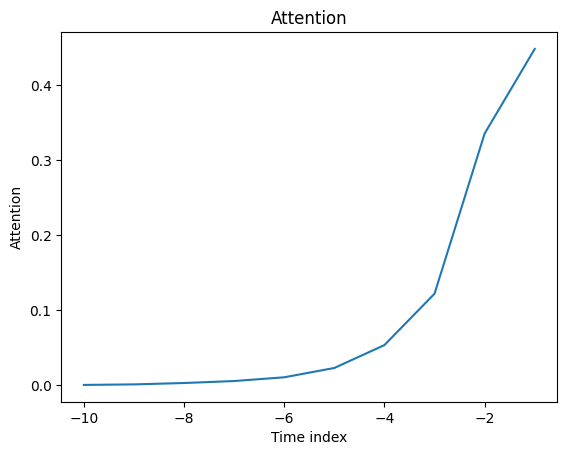

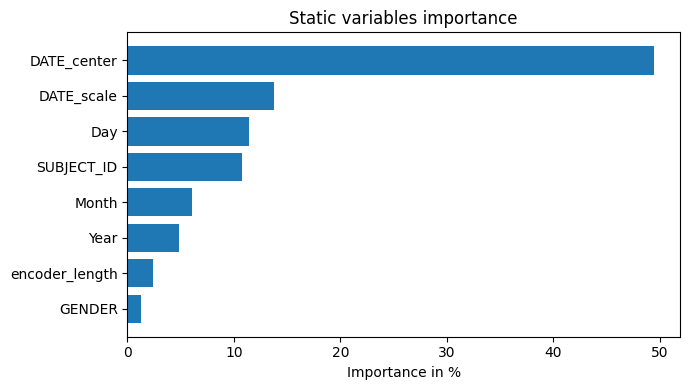

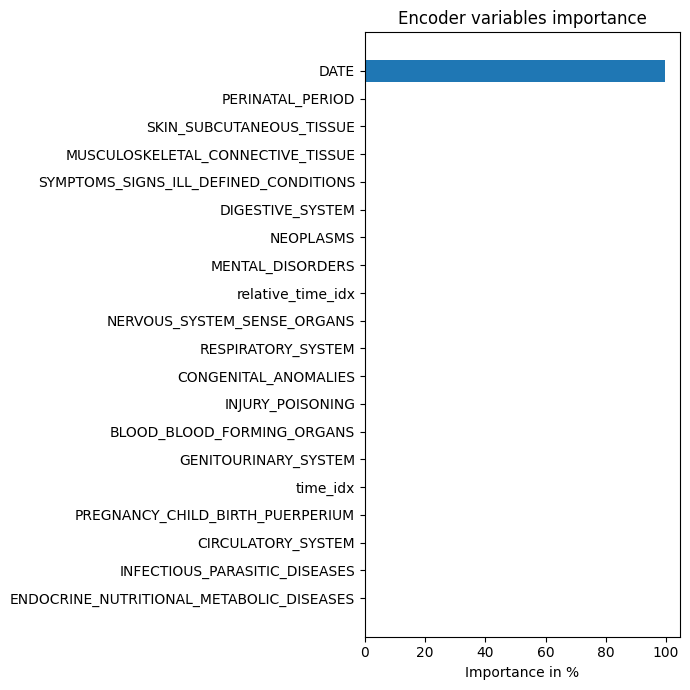

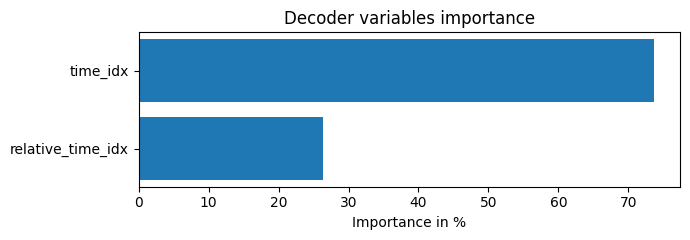

In [37]:
interpretation = best_tft.interpret_output(predictions.output, reduction="sum")
best_tft.plot_interpretation(interpretation)

In [38]:
%reload_ext tensorboard
%tensorboard --logdir lightning_logs

<IPython.core.display.Javascript object>

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pytorch_forecasting/models/base_model.py:2221: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = pl

{'Day': <Figure size 1000x500 with 2 Axes>,
 'Month': <Figure size 1000x500 with 2 Axes>,
 'Year': <Figure size 1000x500 with 2 Axes>,
 'GENDER': <Figure size 1000x500 with 2 Axes>,
 'encoder_length': <Figure size 1000x500 with 2 Axes>,
 'DATE_center': <Figure size 1000x500 with 2 Axes>,
 'DATE_scale': <Figure size 1000x500 with 2 Axes>,
 'time_idx': <Figure size 1000x500 with 2 Axes>,
 'relative_time_idx': <Figure size 1000x500 with 2 Axes>,
 'DATE': <Figure size 1000x500 with 2 Axes>,
 'INFECTIOUS_PARASITIC_DISEASES': <Figure size 1000x500 with 2 Axes>,
 'NEOPLASMS': <Figure size 1000x500 with 2 Axes>,
 'ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES': <Figure size 1000x500 with 2 Axes>,
 'BLOOD_BLOOD_FORMING_ORGANS': <Figure size 1000x500 with 2 Axes>,
 'MENTAL_DISORDERS': <Figure size 1000x500 with 2 Axes>,
 'NERVOUS_SYSTEM_SENSE_ORGANS': <Figure size 1000x500 with 2 Axes>,
 'CIRCULATORY_SYSTEM': <Figure size 1000x500 with 2 Axes>,
 'RESPIRATORY_SYSTEM': <Figure size 1000x500 with 2 Axes

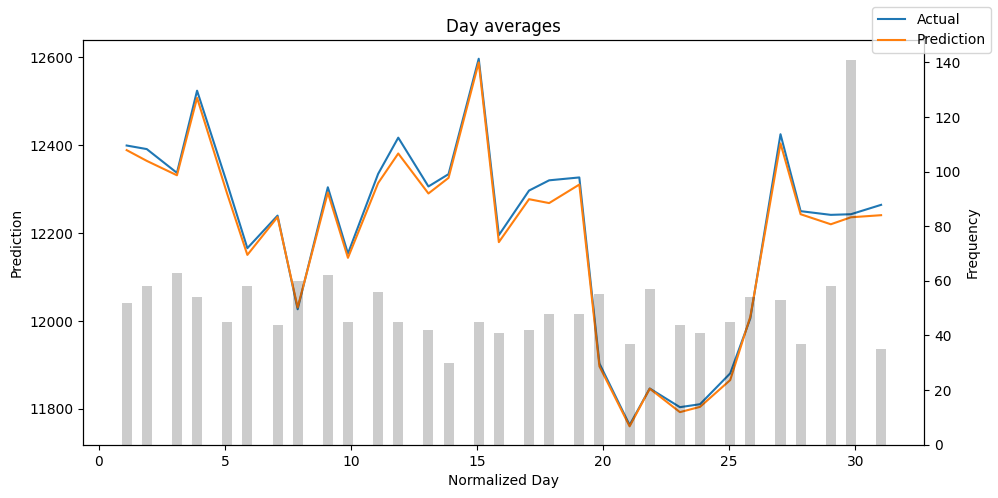

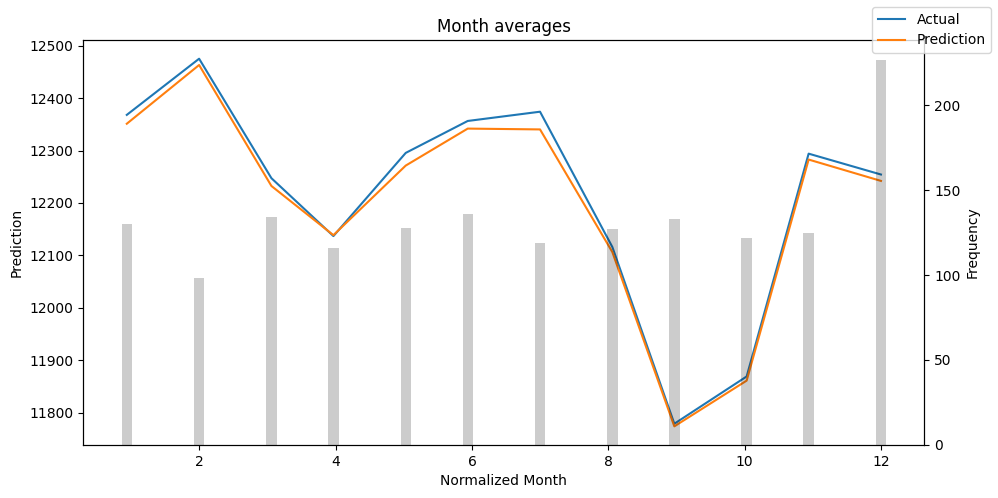

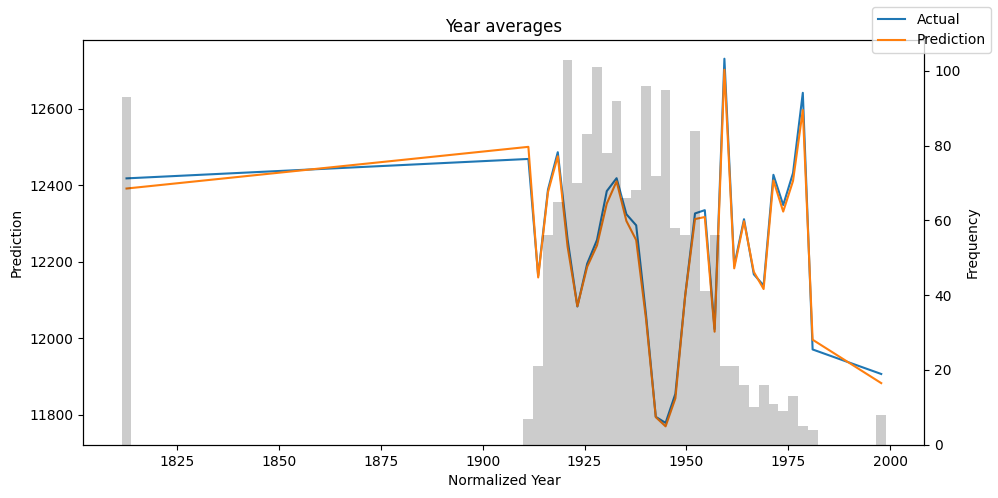

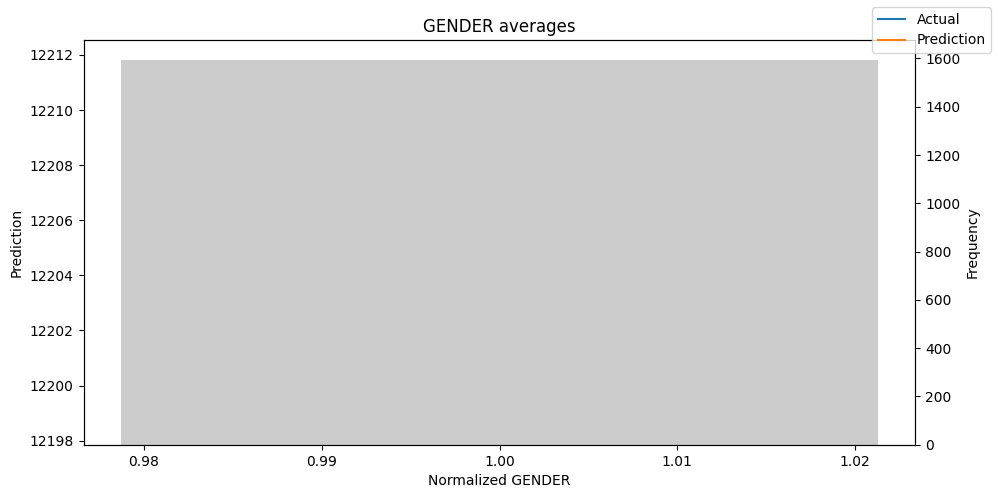

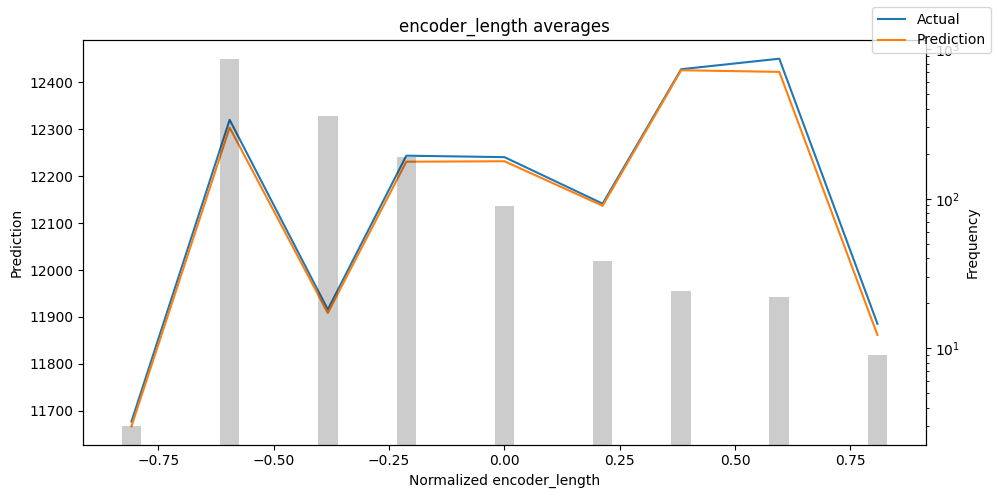

...

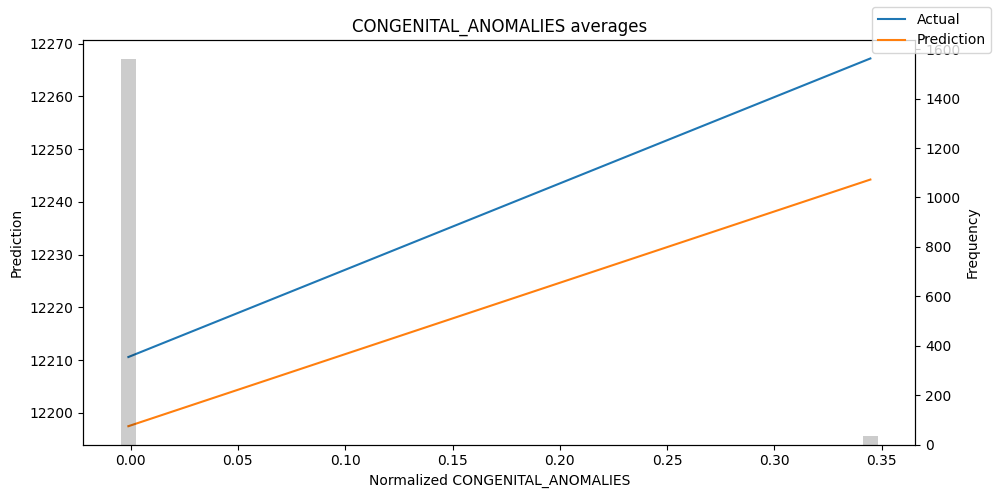

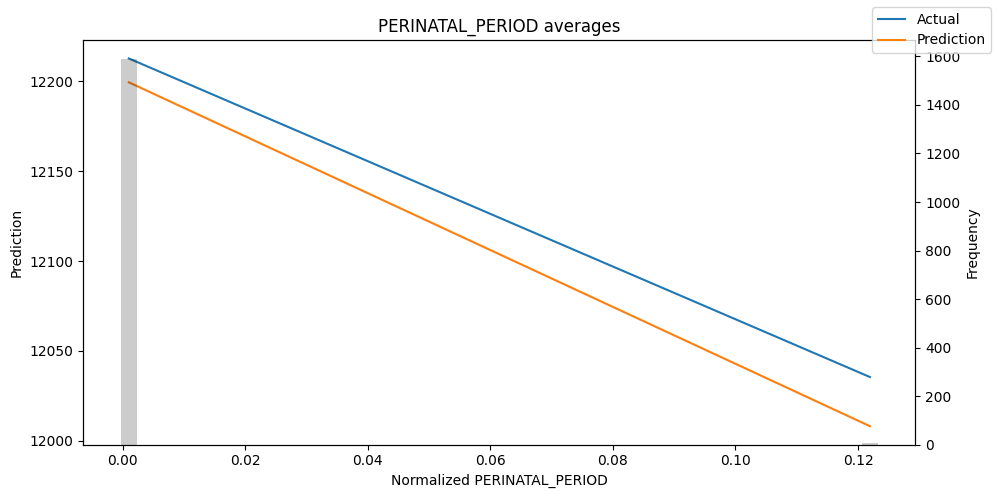

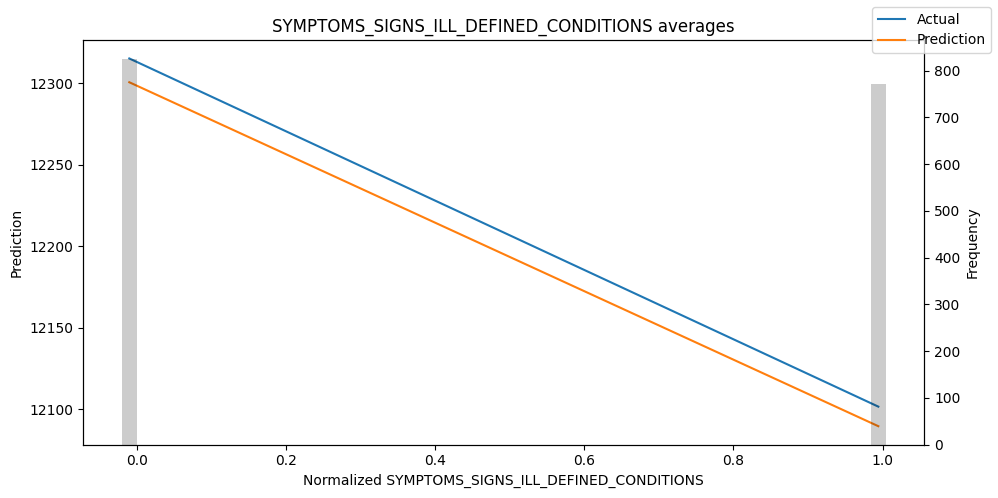

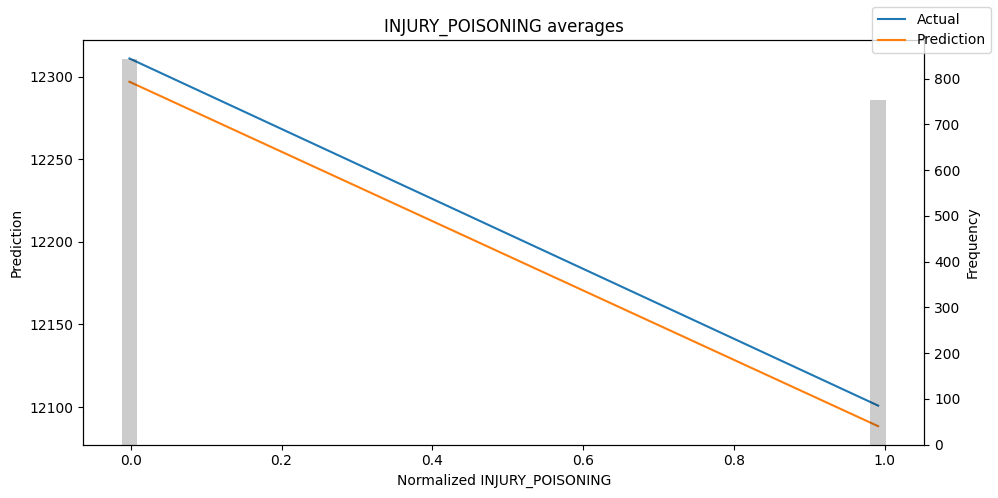

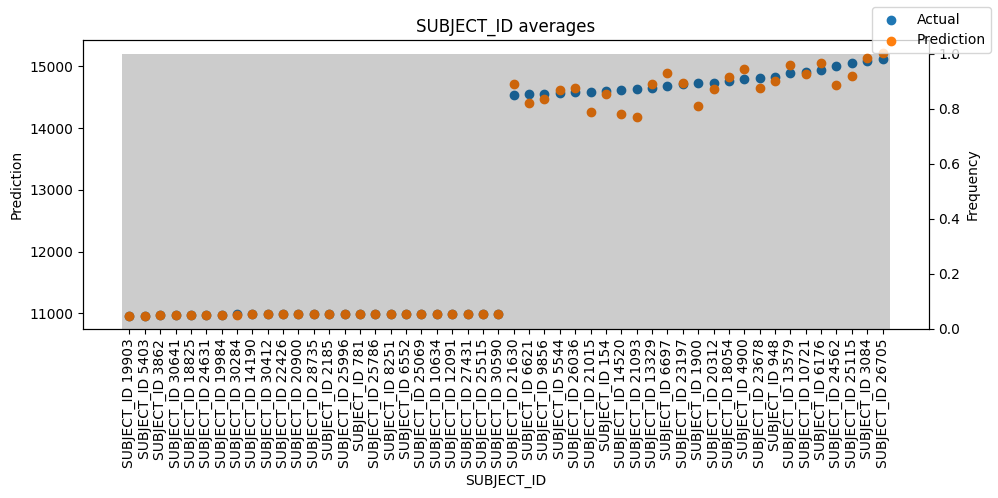

In [39]:
predictions = best_tft.predict(val_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(predictions.x, predictions.output)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

In [40]:
# predictions = best_tft.predict(val_dataloader, return_x=True)
# # Iterate through the values in predictions.x and convert to float if they are tensors
# for key, value in predictions.x.items():
#     if isinstance(value, torch.Tensor):
#         predictions.x[key] = value.float()

# # Convert the predictions.output tensor to float values
# if isinstance(predictions.output, torch.Tensor):
#     predictions.output = predictions.output.float()

# predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(predictions.x, predictions.output)
# best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

In [41]:
# predictions = best_tft.predict(val_dataloader, return_x=True)
# # Iterate through the values in predictions.x and convert to float if they are tensors
# for key, value in predictions.x.items():
#     if isinstance(value, torch.Tensor):
#         predictions.x[key] = value.float()

# # Instead of trying to set the output attribute, create a new dictionary with the modified output
# new_output = predictions.output.float() if isinstance(predictions.output, torch.Tensor) else predictions.output
# # use this new dictionary when calculating and plotting prediction_actual_by_variable
# predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(predictions.x, new_output)
# best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

In [42]:
!pwd

/content


# Save the Best Model

In [43]:
torch.save(best_tft.state_dict(), '/Best_tft_model.pth')

In [44]:
new_tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate= learning_rate,
    hidden_size= hidden_size,
    attention_head_size= attention_head_size,

    hidden_continuous_size= hidden_continuous_size,
    loss=QuantileLoss(),
    # log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    optimizer="AdamW",
    reduce_on_plateau_patience=1,
    lstm_layers= lstm_layers,
    dropout= dropout,
)

# 04/04 with ohe Best Hyperparameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.5692684724008775, 'learning_rate': 0.0003234520234429557, 'attention_head_size': 2}


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


In [45]:
new_tft.load_state_dict(torch.load('/Best_tft_model.pth'))

<All keys matched successfully>

In [46]:
#set the model in the evaluation mode
new_tft.eval()

TemporalFusionTransformer(
  	"attention_head_size":               1
  	"categorical_groups":                {}
  	"causal_attention":                  True
  	"dataset_parameters":                {'time_idx': 'time_idx', 'target': 'DATE', 'group_ids': ['SUBJECT_ID'], 'weight': None, 'max_encoder_length': 10, 'min_encoder_length': 1, 'min_prediction_idx': 1, 'min_prediction_length': 1, 'max_prediction_length': 1, 'static_categoricals': ['SUBJECT_ID'], 'static_reals': ['Day', 'Month', 'Year', 'GENDER'], 'time_varying_known_categoricals': None, 'time_varying_known_reals': ['time_idx'], 'time_varying_unknown_categoricals': None, 'time_varying_unknown_reals': ['DATE', 'INFECTIOUS_PARASITIC_DISEASES', 'NEOPLASMS', 'ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES', 'BLOOD_BLOOD_FORMING_ORGANS', 'MENTAL_DISORDERS', 'NERVOUS_SYSTEM_SENSE_ORGANS', 'CIRCULATORY_SYSTEM', 'RESPIRATORY_SYSTEM', 'DIGESTIVE_SYSTEM', 'GENITOURINARY_SYSTEM', 'PREGNANCY_CHILD_BIRTH_PUERPERIUM', 'SKIN_SUBCUTANEOUS_TISSUE', 'MUS

In [47]:
predictions = new_tft.predict(val_dataloader, return_x=True)
# predictions = new_tft.predict(val_dataloader, return_x=True, return_y=True)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [48]:
predictions.keys()

('output', 'x', 'index', 'decoder_lengths', 'y')

In [49]:
# new_tft.plot_prediction(predictions.y, predictions.output, idx=1, add_loss_to_title=True)

/usr/local/lib/python3.11/dist-packages/pytorch_forecasting/models/base_model.py:2221: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(**kwargs)


{'Day': <Figure size 1000x500 with 2 Axes>,
 'Month': <Figure size 1000x500 with 2 Axes>,
 'Year': <Figure size 1000x500 with 2 Axes>,
 'GENDER': <Figure size 1000x500 with 2 Axes>,
 'encoder_length': <Figure size 1000x500 with 2 Axes>,
 'DATE_center': <Figure size 1000x500 with 2 Axes>,
 'DATE_scale': <Figure size 1000x500 with 2 Axes>,
 'time_idx': <Figure size 1000x500 with 2 Axes>,
 'relative_time_idx': <Figure size 1000x500 with 2 Axes>,
 'DATE': <Figure size 1000x500 with 2 Axes>,
 'INFECTIOUS_PARASITIC_DISEASES': <Figure size 1000x500 with 2 Axes>,
 'NEOPLASMS': <Figure size 1000x500 with 2 Axes>,
 'ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES': <Figure size 1000x500 with 2 Axes>,
 'BLOOD_BLOOD_FORMING_ORGANS': <Figure size 1000x500 with 2 Axes>,
 'MENTAL_DISORDERS': <Figure size 1000x500 with 2 Axes>,
 'NERVOUS_SYSTEM_SENSE_ORGANS': <Figure size 1000x500 with 2 Axes>,
 'CIRCULATORY_SYSTEM': <Figure size 1000x500 with 2 Axes>,
 'RESPIRATORY_SYSTEM': <Figure size 1000x500 with 2 Axes

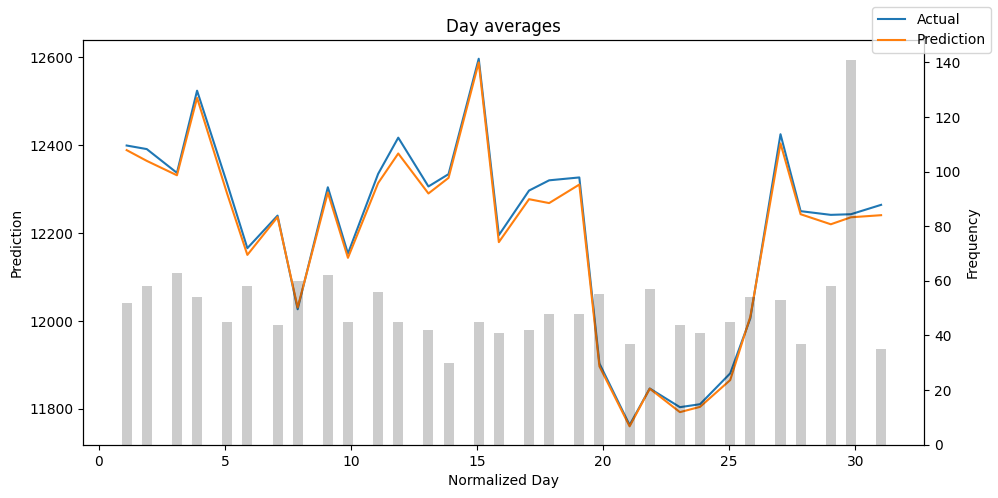

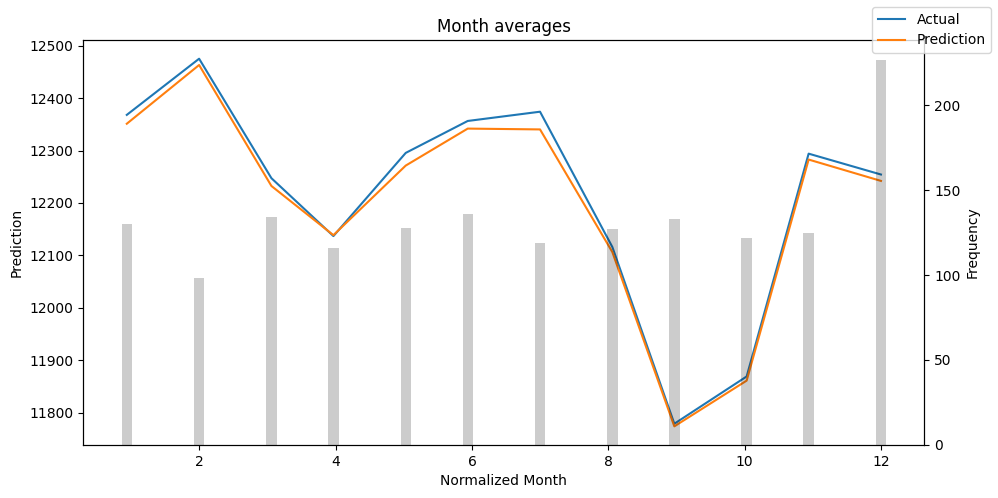

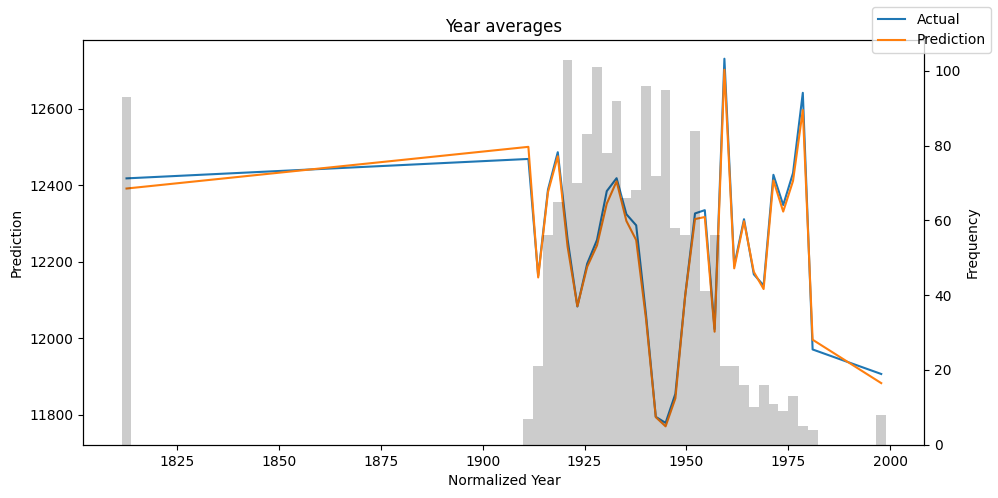

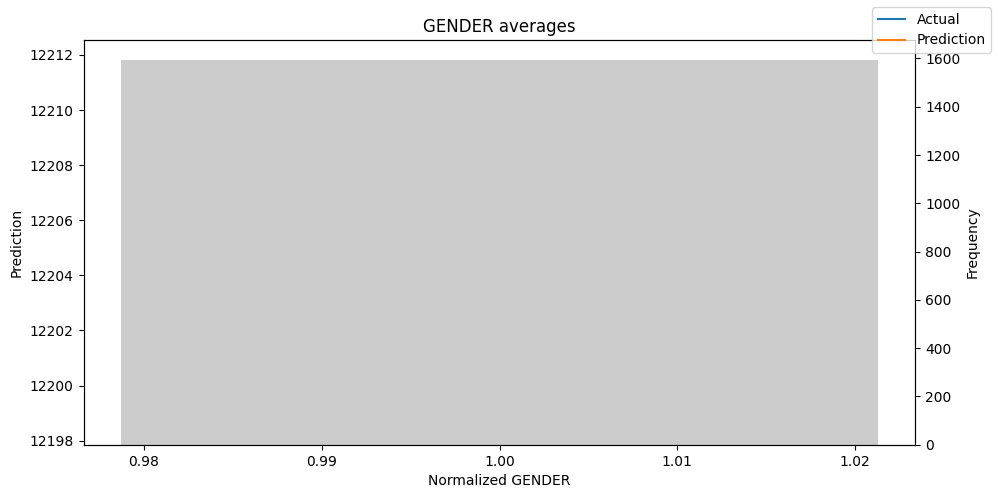

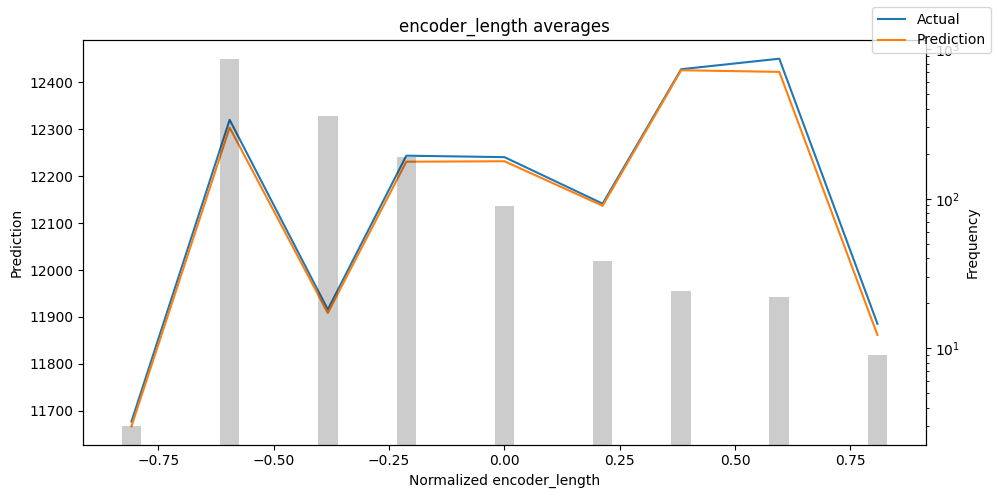

...

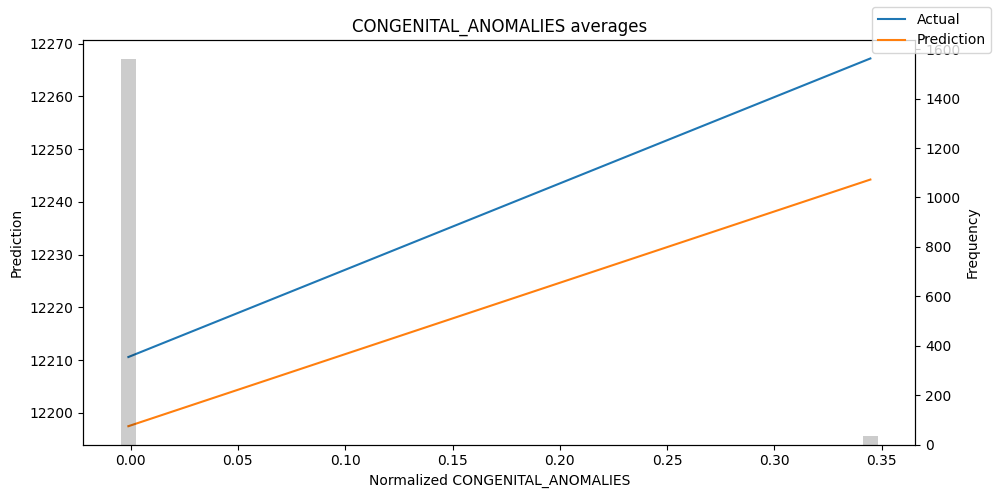

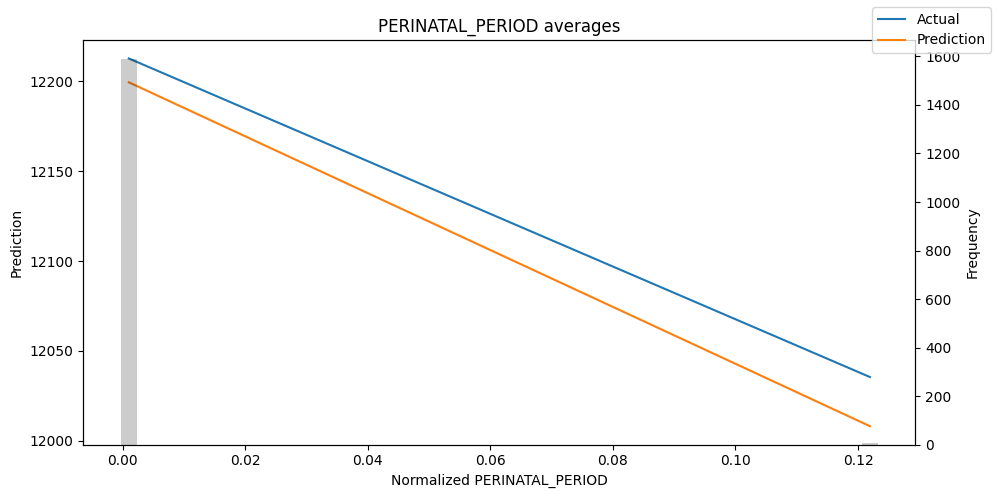

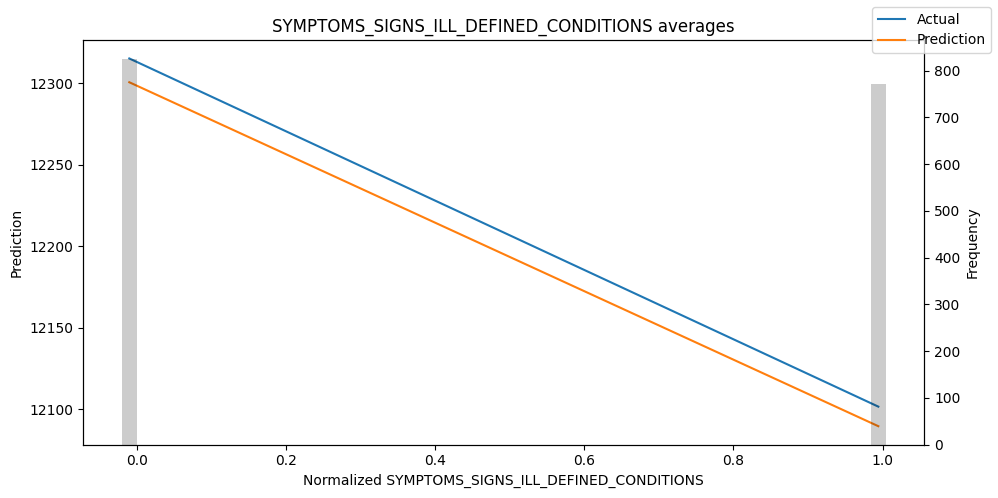

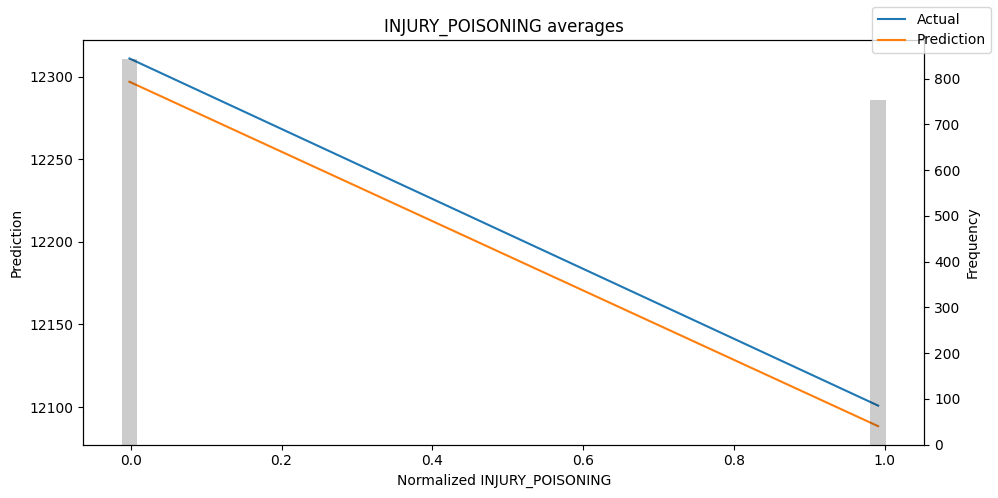

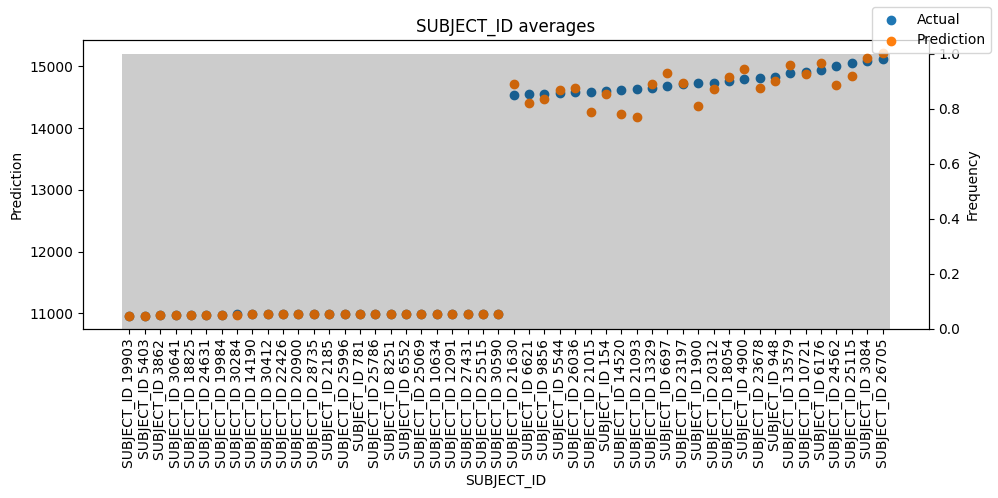

In [50]:
predictions_vs_actuals = new_tft.calculate_prediction_actual_by_variable(predictions.x, predictions.output)
new_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

In [51]:
predictions.output

tensor([[11269.1016],
        [11082.9990],
        [12649.6533],
        ...,
        [11436.3682],
        [12171.6318],
        [11732.6709]], device='cuda:0')

In [52]:
print(predictions.x['groups'])

tensor([[   0],
        [   1],
        [   2],
        ...,
        [1592],
        [1593],
        [1594]], device='cuda:0')


In [53]:
print(predictions.y)

None


In [54]:
import torch

# Get the device from the model (assumes model is on CUDA if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Fetch one batch from validation dataloader
batch = next(iter(val_dataloader))
x, y = batch  # Unpack inputs and target values

print(f"Keys in x: {x.keys()}")
print(f"Type of y: {type(y)}")
print(f"Length of y: {len(y)}")
print(y[0][:5])

# Move actual timestamps to the same device as predictions
actual_dates = y[0].to(device)  # Move actual timestamps to GPU if necessary

# Ensure predictions are properly extracted
if isinstance(predictions, tuple):
    predictions_0 = predictions[0]  # Extract predictions if they are in a tuple

print(f"Shape of actual_dates: {actual_dates.shape}")
print(f"Sample values: {actual_dates[:5]}")
print(f"Shape of predictions: {predictions_0.shape}")
print(f"Sample values: {predictions_0[:5]}")

# Move predictions to the same device
predicted_dates = predictions_0.squeeze().to(device)

# Ensure both tensors have the same shape
# min_length = min(predicted_dates.shape[0], actual_dates.shape[0])
# predicted_dates = predicted_dates[:min_length]
# actual_dates = actual_dates[:min_length]

# Compute absolute differences
differences = torch.abs(predicted_dates - actual_dates)

# Compute average difference in seconds
avg_difference = torch.mean(differences).item()

print(f"Average difference: {avg_difference} seconds")
print(f"Average difference in minutes: {avg_difference / 60} minutes")
print(f"Average difference in hours: {avg_difference / 3600} hours")
print(f"Average difference in days: {avg_difference / (3600 * 24)} days")


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Keys in x: dict_keys(['encoder_cat', 'encoder_cont', 'encoder_target', 'encoder_lengths', 'decoder_cat', 'decoder_cont', 'decoder_target', 'decoder_lengths', 'decoder_time_idx', 'groups', 'target_scale'])
Type of y: <class 'tuple'>
Length of y: 2
tensor([[11264.],
        [11084.],
        [12684.],
        [11370.],
        [11050.]])
Shape of actual_dates: torch.Size([320, 1])
Sample values: tensor([[11264.],
        [11084.],
        [12684.],
        [11370.],
        [11050.]], device='cuda:0')
Shape of predictions: torch.Size([1595, 1])
Sample values: tensor([[11269.1016],
        [11082.9990],
        [12649.6533],
        [11373.2529],
        [11051.5811]], device='cuda:0')
Average difference: 1113.114501953125 seconds
Average difference in minutes: 18.551908365885417 minutes
Average difference in hours: 0.3091984727647569 hours
Average difference in days: 0.01288326969853154 days


In [55]:
import torch
import numpy as np

def evaluate_predictions(x, out, idx=0):
    """
    Compute MSE, MAE, and RMSE for next visit date predictions.

    Args:
        x: predictions.x (model input features)
        out: predictions.output (model output predictions)
        idx: batch index to evaluate

    Returns:
        dict: Dictionary of MSE, MAE, RMSE
    """
    # Handle predictions
    y_pred = out  # since predictions.output is a Tensor
    if y_pred.dim() == 2:
        y_pred = y_pred[idx]  # shape: [decoder_length]
    elif y_pred.dim() == 3:
        y_pred = y_pred[idx, :, 0]  # shape: [decoder_length]
    else:
        raise ValueError(f"Unexpected prediction shape: {y_pred.shape}")

    y_pred = y_pred.detach().cpu().numpy()

    # Handle targets
    y_true = x['decoder_target'][idx].detach().cpu().numpy()

    # print lengths
    print(f"Length of y_pred: {len(y_pred)}")
    print(f"Length of y_true: {len(y_true)}")

    # Ensure matching length
    min_len = min(len(y_true), len(y_pred))
    y_true = y_true[:min_len]
    y_pred = y_pred[:min_len]

    # Compute metrics
    mse = np.mean((y_true - y_pred) ** 2)
    mae = np.mean(np.abs(y_true - y_pred))
    rmse = np.sqrt(mse)

    return {"MSE": mse, "MAE": mae, "RMSE": rmse}

# ✅ Example usage:
metrics = evaluate_predictions(predictions.x, predictions.output, idx=0)
print(metrics)


Length of y_pred: 1
Length of y_true: 1
{'MSE': np.float32(26.02594), 'MAE': np.float32(5.1015625), 'RMSE': np.float32(5.1015625)}


In [56]:
import torch
import numpy as np

def evaluate_batch_predictions(x, out):
    """
    Compute average MSE, MAE, and RMSE across the entire batch.

    Args:
        x: predictions.x (model input features)
        out: predictions.output (model output predictions)

    Returns:
        dict: Dictionary of average MSE, MAE, RMSE
    """
    y_preds = out  # Tensor, shape [batch, decoder_len, 1] or [batch, decoder_len]
    y_trues = x["decoder_target"]  # Tensor, shape [batch, decoder_len]

    # Ensure shapes
    # if y_preds.dim() == 3:
    #     y_preds = y_preds[:, :, 0]  # squeeze last dim if necessary

    y_preds = y_preds.detach().cpu().numpy()
    y_trues = y_trues.detach().cpu().numpy()

    batch_mse, batch_mae = [], []

    for i in range(y_preds.shape[0]):
        pred = y_preds[i]
        true = y_trues[i]

        # Match lengths just in case
        # min_len = min(len(pred), len(true))
        # pred = pred[:min_len]
        # true = true[:min_len]

        mse = np.mean((true - pred) ** 2)
        mae = np.mean(np.abs(true - pred))

        batch_mse.append(mse)
        batch_mae.append(mae)

    print(f"Length of batch_mse: {len(batch_mse)}")
    print(batch_mae)
    avg_mse = np.mean(batch_mse)
    avg_mae = np.mean(batch_mae)
    avg_rmse = np.sqrt(avg_mse)

    return {"MSE": avg_mse, "MAE": avg_mae, "RMSE": avg_rmse}

# ✅ Example usage:
metrics = evaluate_batch_predictions(predictions.x, predictions.output)
print(metrics)


Length of batch_mse: 1595
[np.float32(5.1015625), np.float32(1.0009766), np.float32(34.34668), np.float32(3.2529297), np.float32(1.5810547), np.float32(303.4873), np.float32(2.0234375), np.float32(110.24902), np.float32(18.733398), np.float32(1.4941406), np.float32(32.552734), np.float32(0.060546875), np.float32(0.4609375), np.float32(81.49609), np.float32(3.0722656), np.float32(136.78809), np.float32(12.451172), np.float32(31.530273), np.float32(46.214844), np.float32(4.126953), np.float32(41.921875), np.float32(152.64844), np.float32(62.597656), np.float32(273.41504), np.float32(26.881836), np.float32(23.311523), np.float32(38.594727), np.float32(57.62793), np.float32(52.368164), np.float32(5.913086), np.float32(10.145508), np.float32(0.7841797), np.float32(6.584961), np.float32(92.90723), np.float32(12.322266), np.float32(65.362305), np.float32(40.811523), np.float32(87.02734), np.float32(14.96875), np.float32(19.570312), np.float32(112.55957), np.float32(47.578125), np.float32(0.70

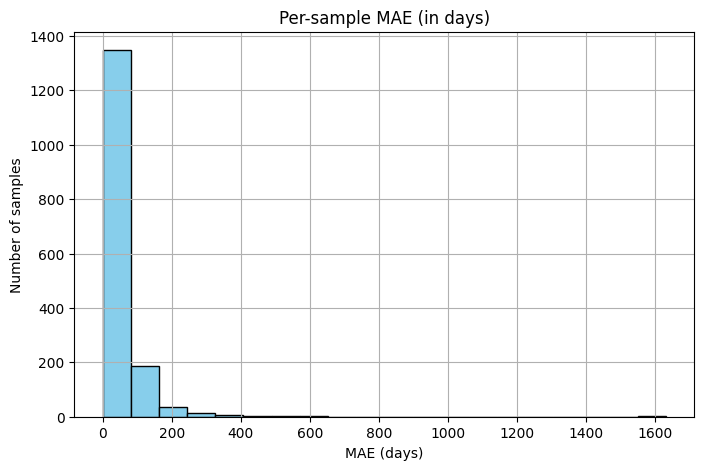

In [57]:
import torch
import matplotlib.pyplot as plt

# Get prediction and true values (assumed shape: [batch_size, decoder_length])
pred = predictions.output.detach().cpu().float()
true = predictions.x['decoder_target'].detach().cpu().float()

# Compute per-sample MAE (L1 loss along decoder length)
per_sample_mae = torch.mean(torch.abs(pred - true), dim=1)  # shape: [batch_size]

# Convert to NumPy array for plotting
per_sample_mae_np = per_sample_mae.numpy()

# Plot histogram
plt.figure(figsize=(8, 5))
plt.hist(per_sample_mae_np, bins=20, edgecolor='black', color='skyblue')
plt.title("Per-sample MAE (in days)")
plt.xlabel("MAE (days)")
plt.ylabel("Number of samples")
plt.grid(True)
plt.show()


In [58]:
# Display stats
print("Per-sample MAE (in days):")
print(f"Min: {per_sample_mae.min().item():.2f}")
print(f"Max: {per_sample_mae.max().item():.2f}")
print(f"Mean: {per_sample_mae.mean().item():.2f}")

Per-sample MAE (in days):
Min: 0.01
Max: 1632.32
Mean: 43.51
